### Computational Guided Inquiry for PChem (Neshyba, 2023)

# Cruising $S(T,P)$


## Learning Goals
1. Gain an intuition for the shape of $S(T,P)$ for solids, liquids, and gases: their slopes, isobars, and isotherms
1. Explain trends in $\Delta S_{trs}$ (trs=vap, sub, and fus) with respect to changes in pressure and temperature

In [1]:
import pint; from pint import UnitRegistry; AssignQuantity = UnitRegistry().Quantity
import numpy as np
import matplotlib.pyplot as plt
import sys; sys.path.append('/home'); import PchemLibrary as PL

In [2]:
%matplotlib notebook

### Lay out a T,P state space

In [3]:
# Lay out the state space
Tgrid, Pgrid_bar = PL.Statespace([200,400,100],[1,10,101])
Pgrid_bar = AssignQuantity(Pgrid_bar,'bar')
Pgrid = Pgrid_bar.to('pascal')
Tgrid = AssignQuantity(Tgrid,'K')

### Some general-purpose constants

In [4]:
# Gas constant in SI units
R = AssignQuantity(8.314,'J /mol/K')

# Standard state conditions, in SI units
T0 = AssignQuantity(298,'K')
P0 = AssignQuantity(1e5,'pascal')

### Constants pertaining to water
The following cell provides constants for three phases of water - See https://webbook.nist.gov/chemistry/name-ser/ for standard-state entropy values.

In [5]:
# Molar mass of water
M = AssignQuantity(.018,'kg/mol')

# Parameters for gaseous water
CP_gas = AssignQuantity(33.6,'J/K/mol')
SS_gas = [T0,P0,AssignQuantity(188.835,'J/K/mol')] # Specifying the standard state entropy

# Parameters for liquid water
Vgrid_liq = AssignQuantity(0.018,'m^3 /mol')*np.ones(np.shape(Pgrid)) # Molar volume, as a state-space grid
alpha_P_liq = AssignQuantity(2.1e-4,'1/K') # Thermal expansivity
CP_liq = AssignQuantity(75.4,'J/K/mol') # Heat capacity
SS_liq = [T0,P0,AssignQuantity(69.95,'J/K/mol')]

# Parameters for ice water
Vgrid_sol = 1.1*Vgrid_liq # 10% of icebergs are above the water
alpha_P_sol = AssignQuantity(0.5e-4,'1/K') 
CP_sol = AssignQuantity(38,'J/K/mol')
SS_sol = [T0,P0,AssignQuantity(46.5,'J/K/mol')]

### Visualizing $\big (\partial S/ \partial T \big )_P$ 
Below, we calculate and display $\big (\partial S/ \partial T \big )_P = \frac {C_P}T$, for water in the form of a gas, liquid, and solid.

In [6]:
# dSdT for the gas
dSdT_gas = CP_gas/Tgrid

# dSdT for the liquid
dSdT_liq = CP_liq/Tgrid

# dSdT for the solid
dSdT_sol = CP_sol/Tgrid

# Collected in a list
dSdTlist = [dSdT_gas, dSdT_liq, dSdT_sol]

# Prepping the labels
xlabel = "T "+str(Tgrid.units)
ylabel = "P "+str(Pgrid_bar.units)
zlabel = "dS/dT "+str(dSdT_liq.units)
llist = [xlabel,ylabel,zlabel]

# Prepping the colors
clist = ['green', 'blue', 'gray']
tlist = ['gas', 'liq', 'sol']

# Graphics
PL.plot_surfaces(Tgrid, Pgrid_bar, dSdTlist, colorlist=clist, titlelist=tlist, labellist=llist)

### Pause for analysis
In the cell below, provide an explanation for why the liquid's $\big (\partial S/ \partial T \big )_P$ is so much bigger than that of the gas or the solid. *Hint: Look at the heat capacities.*

### BEGIN SOLUTION

The heat capacity of the liquid is about twice that of the solid or the gas.

### END SOLUTION

### Visualizing $\big (\partial S/ \partial P \big )_T$

- For the gas, we think $\big (\partial S/ \partial P \big )_T = -R/P$ is a good approximation.
- For the liquid, we think $\big (\partial S/ \partial P \big )_T = -V_{liq} \times \alpha_{P,liq}$, where $V_{liq}$ and $\alpha_{P,liq}$ are constants. 
- For the solid, we think $\big (\partial S/ \partial P \big )_T = -V_{sol} \times \alpha_{P,sol}$, where $V_{sol}$ and $\alpha_{P,sol}$ are constants. 

All these quantities, as written, are on a per-mole basis, according to the constants we've set up above. In the cell below, we calculate and plot all three.

In [7]:
# dSdP
dSdP_gas = -R/Pgrid
dSdP_liq = -Vgrid_liq*alpha_P_liq
dSdP_sol = -Vgrid_sol*alpha_P_sol

# Collected in a list
dSdPlist = [dSdP_gas, dSdP_liq, dSdP_sol]

# Prepping the labels
zlabel = "dS/dP "+str(dSdP_liq.units)
llist = [xlabel,ylabel,zlabel]

# Prepping the colors
clist = ['green', 'blue', 'gray']
tlist = ['gas', 'liq', 'sol']

# Graphics
PL.plot_surfaces(Tgrid, Pgrid_bar, dSdPlist, colorlist=clist, titlelist=tlist, labellist=llist)

### Pause for analysis
In the cell below, provide an explanation for why $\big (\partial S/ \partial P \big )_T$ so much bigger for the gas compared to the liquid and solid.

### BEGIN SOLUTION

Gases are very compressible, so their entropy is very sensitive to the changes in volume resulting from changes in pressure. 

### END SOLUTION

### Visualizing $S(T,P)$ for the gas
Below, we show how to use a new state-space integrator function, called PL.Integrator, to calculate and display the entropy of water vapor, with an offset according to standard-state entropy tables (see https://webbook.nist.gov/chemistry/name-ser/).

<IPython.core.display.Javascript object>


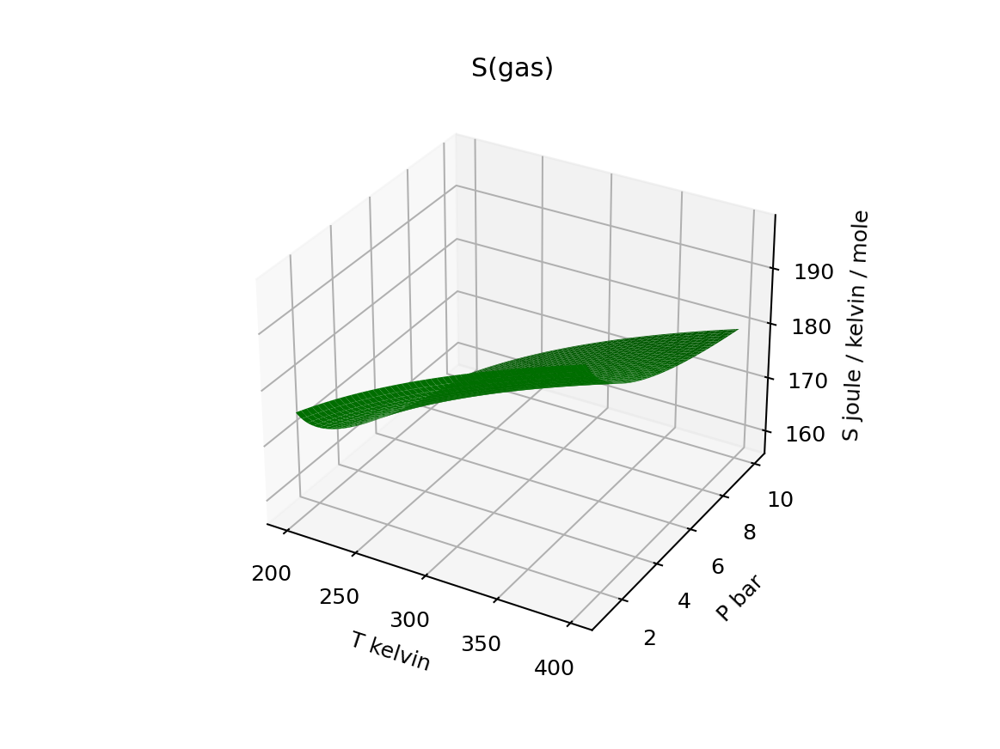

<IPython.core.display.Javascript object>


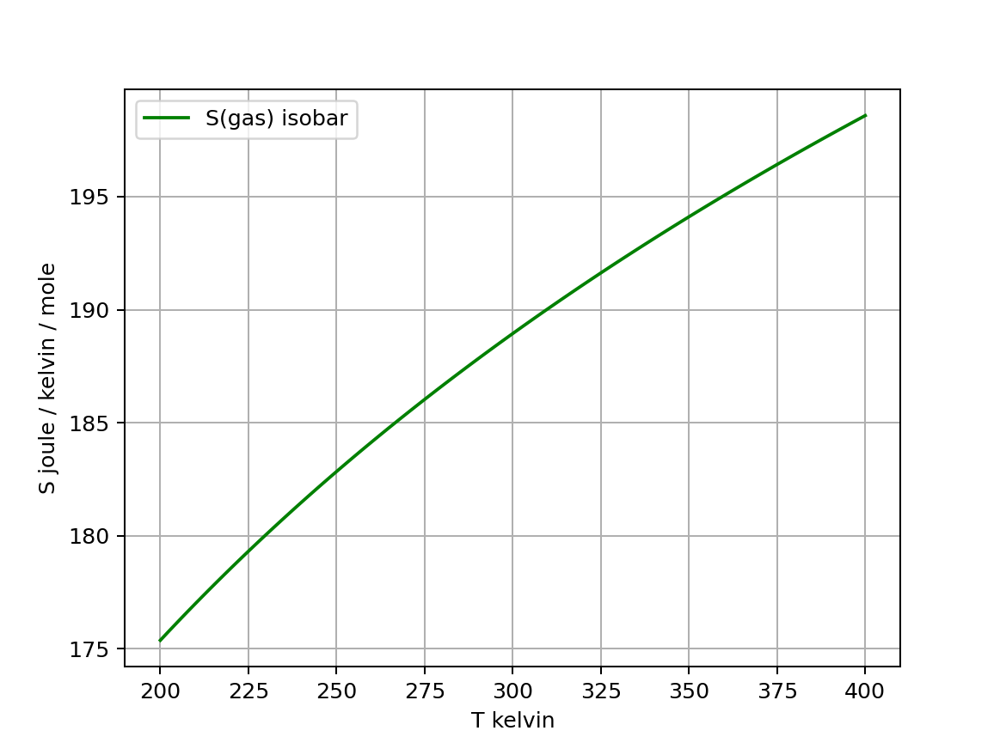

1.0 bar


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



<IPython.core.display.Javascript object>


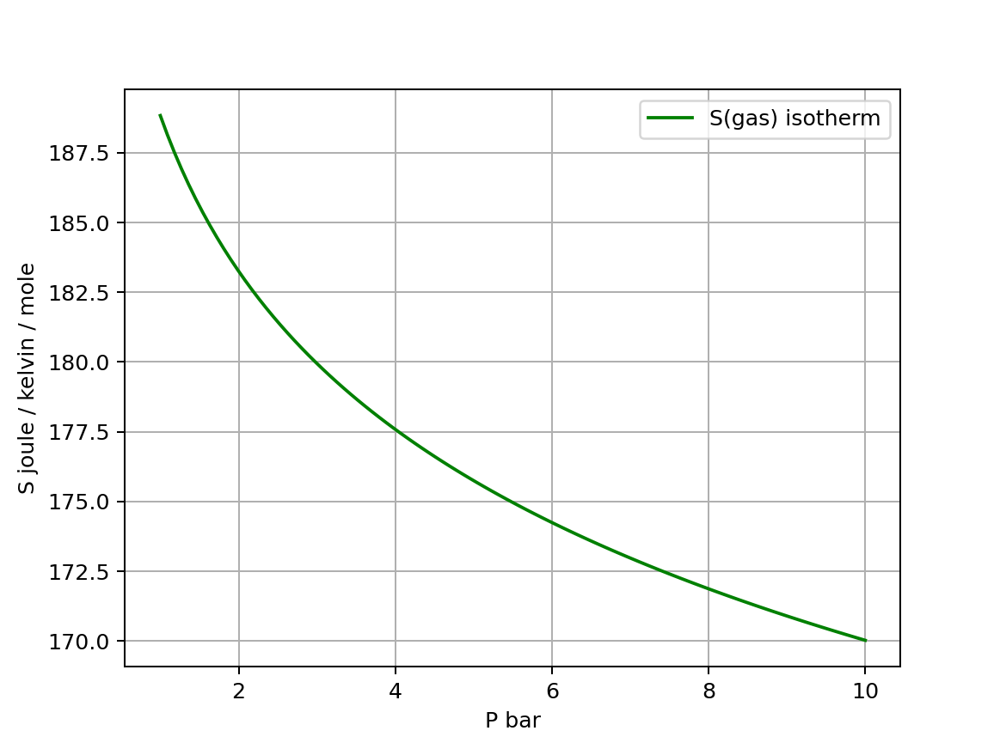

298.98989898989896 kelvin


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



In [8]:
# Calculate the entropies as thermodynamic surfaces
S_gas = PL.Integrator([Tgrid, Pgrid], dSdT_gas, dSdP_gas, AssignQuantity, Units='J/K/mol', SState=SS_gas)

# Prepping the labels
xlabel = "T "+str(Tgrid.units)
ylabel = "P "+str(Pgrid_bar.units)
zlabel = "S "+str(S_gas.units) 
llist = [xlabel, ylabel, zlabel]

# Graphing S(T,P)
PL.plot_surface1(Tgrid, Pgrid_bar, S_gas, color='green',title='S(gas)', labellist=llist)

# Graphing an isobaric slice
plt.figure()
isobar = 0 # This corresponds to about 1 bar
print(Pgrid_bar[0,isobar])
plt.plot(Tgrid[:,isobar],S_gas[:,isobar], color='green', label='S(gas) isobar')
plt.grid(True)
plt.xlabel(xlabel)
plt.ylabel(zlabel)
plt.legend()

# Graphing an isothermal slice
plt.figure()
isotherm = 49 # This corresponds to about 298 K
print(Tgrid[isotherm,0])
plt.plot(Pgrid_bar[isotherm,:],S_gas[isotherm,:], color='green', label='S(gas) isotherm')
plt.grid(True)
plt.xlabel(ylabel)
plt.ylabel(zlabel)
plt.legend()

### Pause for analysis
You should double-check that the isobars and isotherms we just plotted are consistent with the thermodynamic surface S(T,P).

### Your turn (liquid)
Do something similar to what we just did, but for liquid water, i.e., 
- an S(T,P) surface of liquid water,
- an isobaric slice at about 1 bar, and
- an isothermal slice at about 298 K

<IPython.core.display.Javascript object>


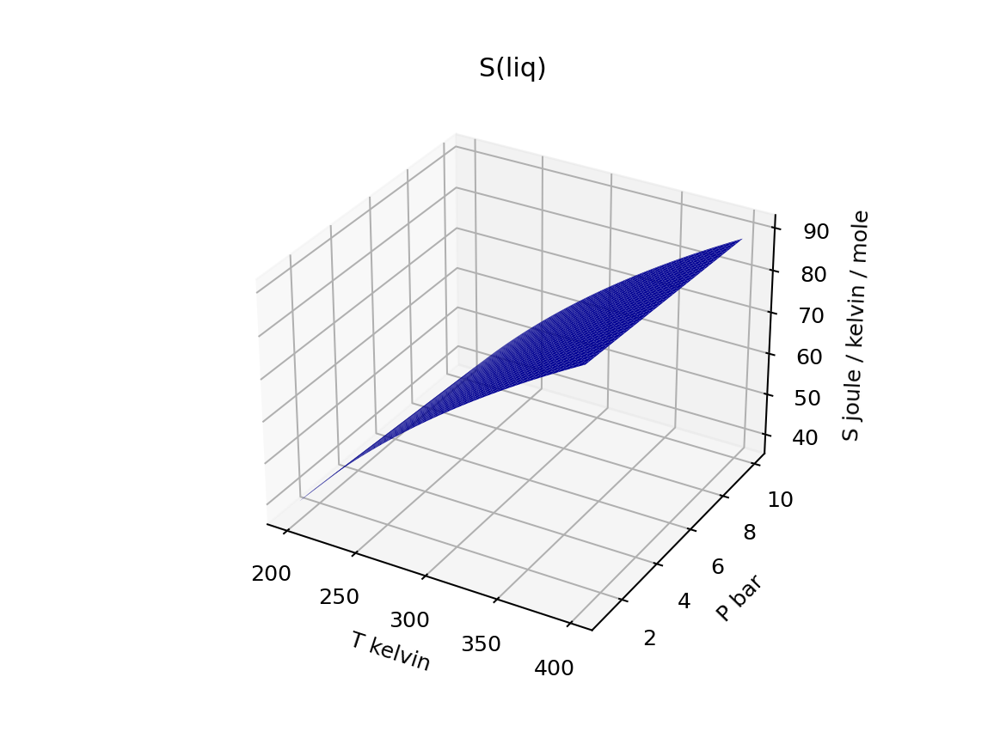

<IPython.core.display.Javascript object>


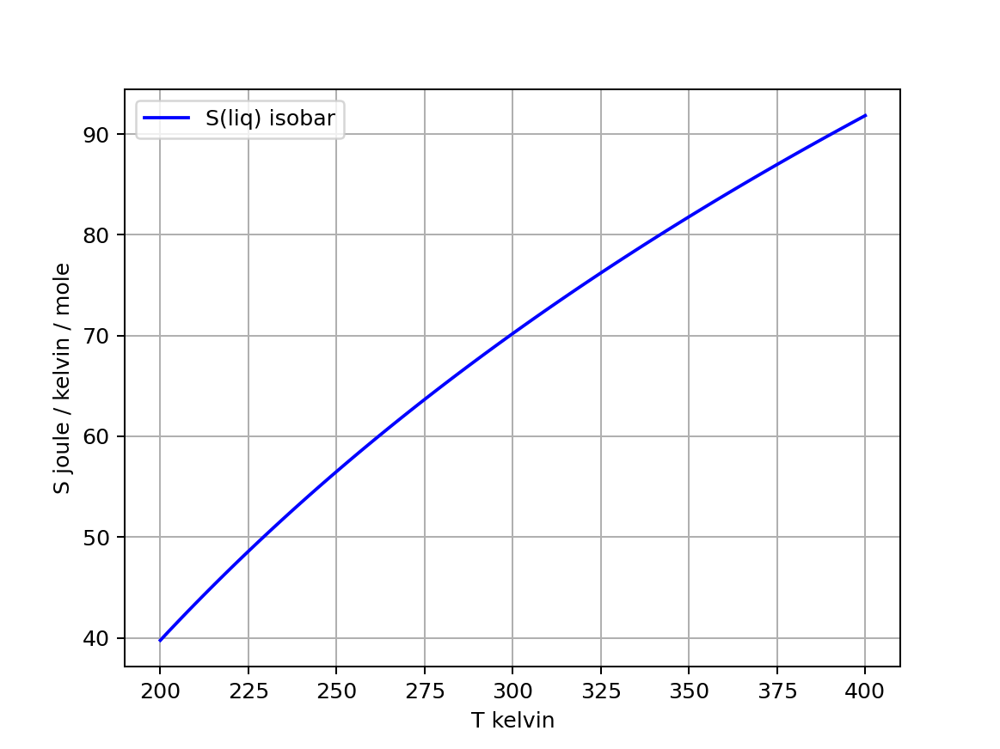

1.0 bar


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



<IPython.core.display.Javascript object>


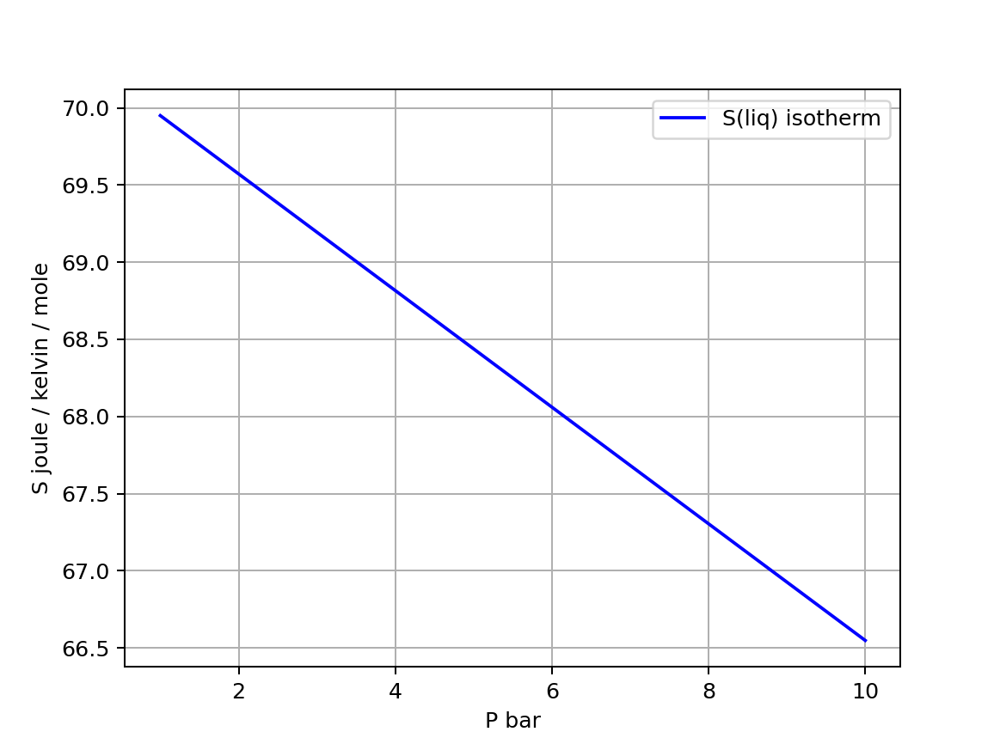

298.98989898989896 kelvin


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



In [9]:
### BEGIN SOLUTION

# Calculate the entropies as thermodynamic surfaces
S_liq = PL.Integrator([Tgrid, Pgrid], dSdT_liq, dSdP_liq, AssignQuantity, Units='J/K/mol', SState=SS_liq)

# Graphing S(T,P)
PL.plot_surface1(Tgrid, Pgrid_bar, S_liq, color='blue',title='S(liq)', labellist=llist)

# Graphing an isobaric slice
plt.figure()
isobar = 0 # This corresponds to about 1 bar
print(Pgrid_bar[0,isobar])
plt.plot(Tgrid[:,isobar],S_liq[:,isobar], color='blue', label='S(liq) isobar')
plt.grid(True)
plt.xlabel(xlabel)
plt.ylabel(zlabel)
plt.legend()

# Graphing an isothermal slice
plt.figure()
isotherm = 49 # This corresponds to about 298 K
print(Tgrid[isotherm,0])
plt.plot(Pgrid_bar[isotherm,:],S_liq[isotherm,:], color='blue', label='S(liq) isotherm')
plt.grid(True)
plt.xlabel(ylabel)
plt.ylabel(zlabel)
plt.legend()

### END SOLUTION

### Pause for analysis
As before, double-check that the isobars and isotherms your just plotted are consistent with the thermodynamic surface S(T,P).

### Your turn (solid)
Do something similar to what we just did, but for solid water (ice), i.e.,
- an S(T,P) surface of ice,
- an isobaric slice at about 1 bar, and
- an isothermal slice at about 298 K

<IPython.core.display.Javascript object>


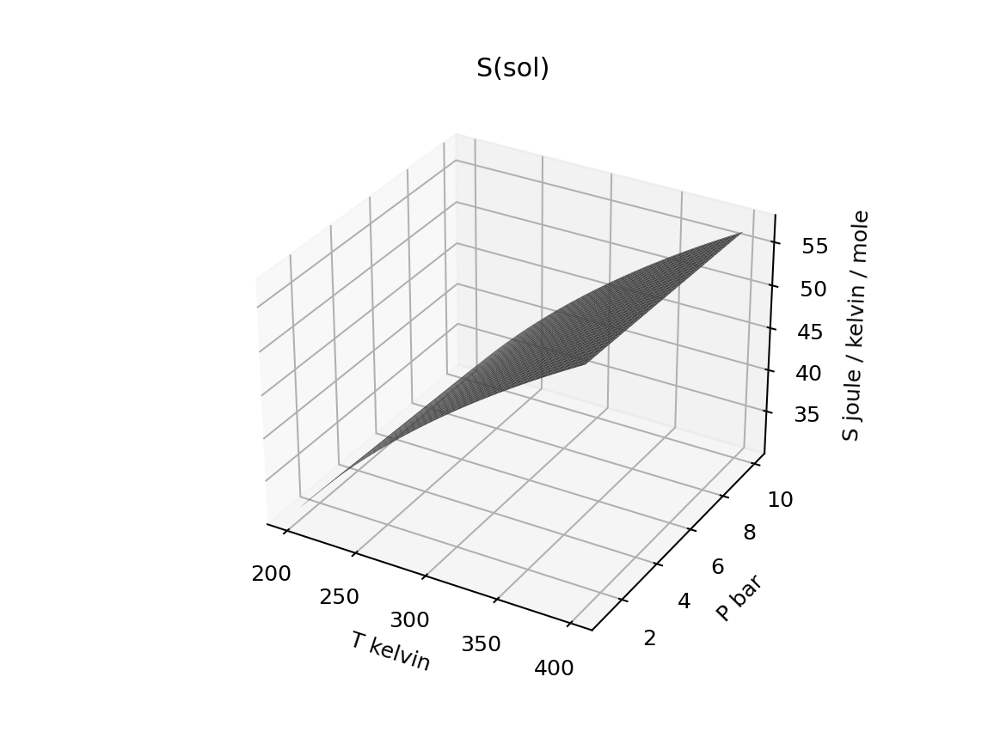

<IPython.core.display.Javascript object>


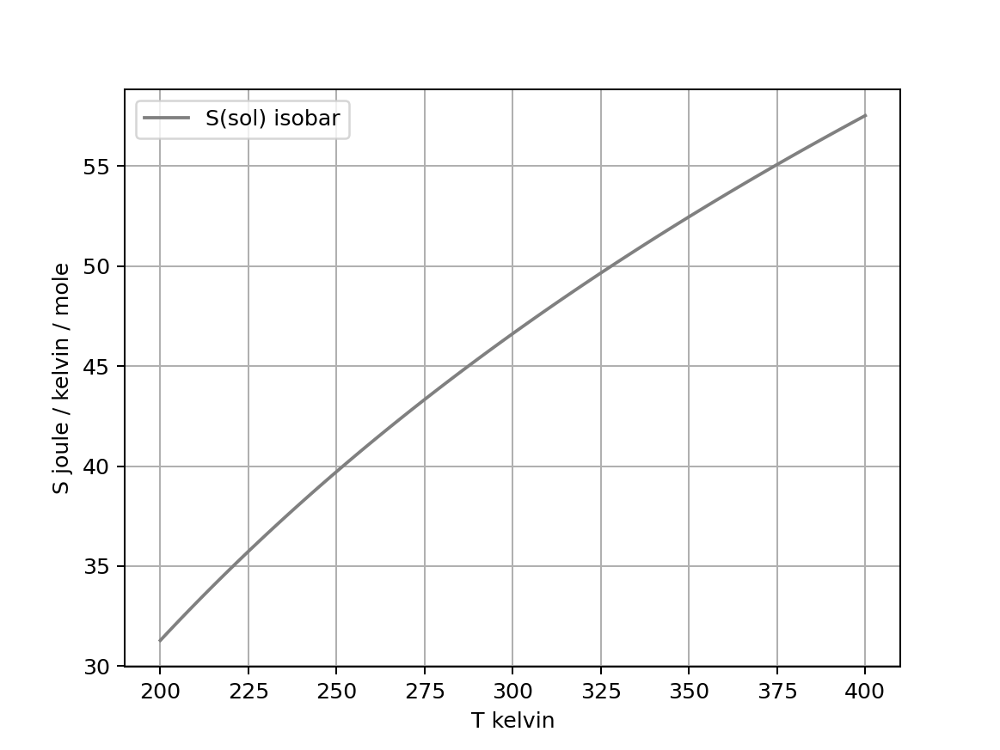

1.0 bar


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



<IPython.core.display.Javascript object>


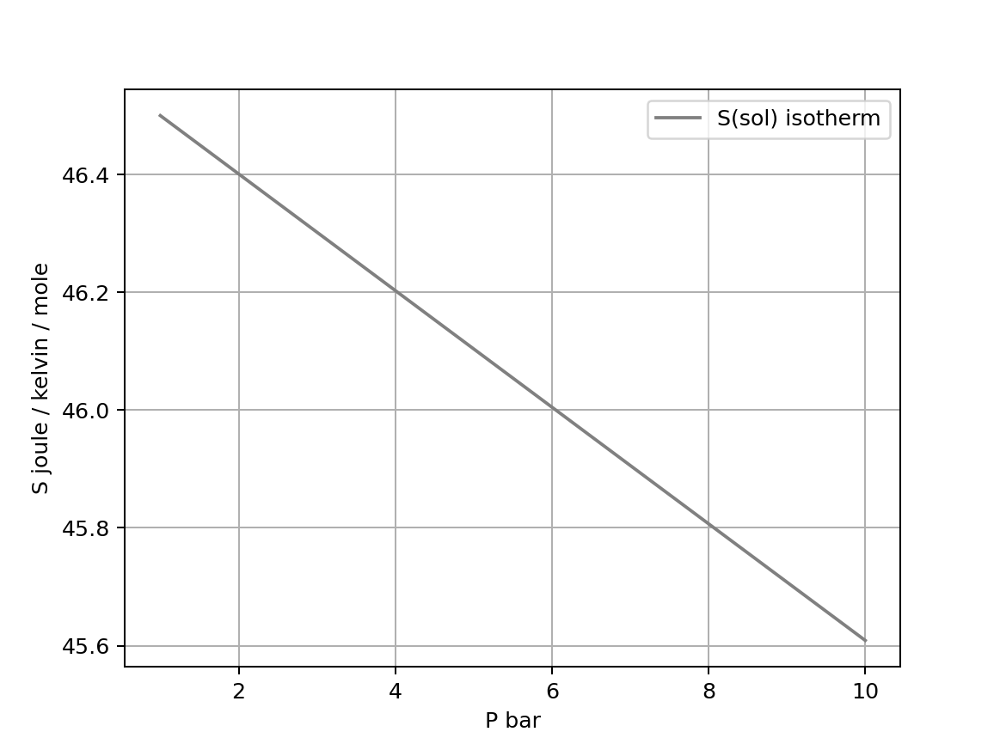

298.98989898989896 kelvin


/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



In [10]:
### BEGIN SOLUTION

# Calculate the entropies as thermodynamic surfaces
S_sol = PL.Integrator([Tgrid, Pgrid], dSdT_sol, dSdP_sol, AssignQuantity, Units='J/K/mol', SState=SS_sol)

# Graphing S(T,P)
PL.plot_surface1(Tgrid, Pgrid_bar, S_sol, color='gray',title='S(sol)', labellist=llist)

# Graphing an isobaric slice
plt.figure()
isobar = 0 # This corresponds to about 1 bar
print(Pgrid_bar[0,isobar])
plt.plot(Tgrid[:,isobar],S_sol[:,isobar], color='gray', label='S(sol) isobar')
plt.grid(True)
plt.xlabel(xlabel)
plt.ylabel(zlabel)
plt.legend()

# Graphing an isothermal slice
plt.figure()
isotherm = 49 # This corresponds to about 298 K
print(Tgrid[isotherm,0])
plt.plot(Pgrid_bar[isotherm,:],S_sol[isotherm,:], color='gray', label='S(sol) isotherm')
plt.grid(True)
plt.xlabel(ylabel)
plt.ylabel(zlabel)
plt.legend()

### END SOLUTION

### Comparing entropies of all three phases
It's a bit hard to compare one phase to another when looking at separate plots, so in the cell below, combine them:
- One plot that shows S(T,P) for all three phases;
- Another plot that shows isobaric slices for all three entropy surfaces; and
- Another that shows isothermal slices for all three entropy surfaces.

<IPython.core.display.Javascript object>


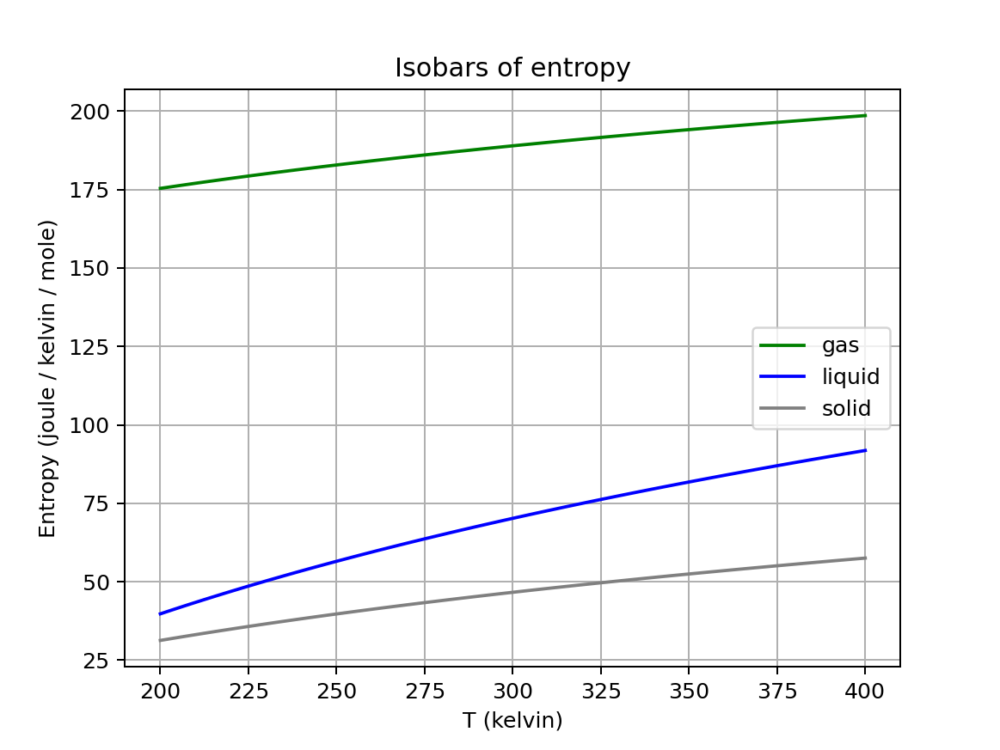

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



<IPython.core.display.Javascript object>


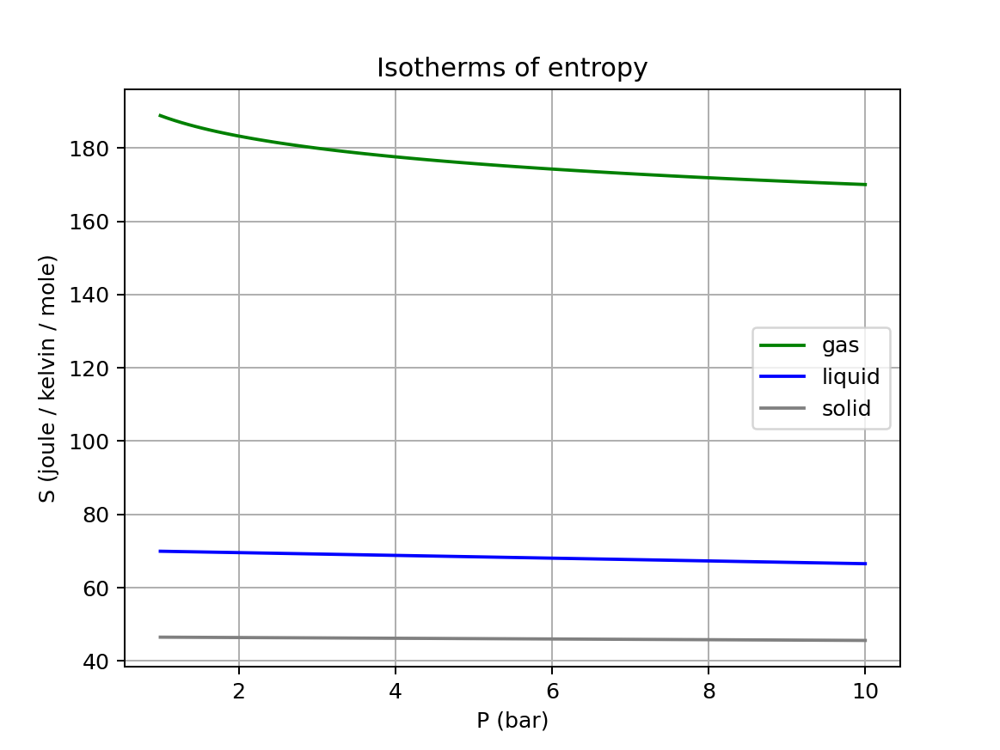

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.

/home/instructor/.local/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1298: UnitStrippedWarning:

The unit of the quantity is stripped when downcasting to ndarray.



Text(0.5, 1.0, 'Isotherms of entropy')

In [11]:
### BEGIN SOLUTION

# Collecting surfaces
Slist = [S_gas, S_liq, S_sol]
clist = ['green', 'blue', 'gray']
tlist = ['gas', 'liq', 'sol']

# Graphing surfaces
PL.plot_surfaces(Tgrid, Pgrid_bar, Slist, colorlist=clist, titlelist=tlist, labellist=llist).show()

# Graphing isobaric slices
plt.figure()
isobar = 0 # This corresponds to about 1 bar
plt.plot(Tgrid[:,isobar],S_gas[:,isobar], color='green', label='gas')
plt.plot(Tgrid[:,isobar],S_liq[:,isobar], color='blue', label='liquid')
plt.plot(Tgrid[:,isobar],S_sol[:,isobar], color='gray', label='solid')
plt.grid(True)
plt.legend()
plt.xlabel('T ('       +str(Tgrid.units) +')')
plt.ylabel('Entropy (' +str(S_sol.units) + ')')
plt.title('Isobars of entropy')

# Graphing isothermal slices
plt.figure()
isotherm = 49 # This corresponds to about 298 K
plt.plot(Pgrid_bar[isotherm,:],S_gas[isotherm,:], color='green', label='gas')
plt.plot(Pgrid_bar[isotherm,:],S_liq[isotherm,:], color='blue', label='liquid')
plt.plot(Pgrid_bar[isotherm,:],S_sol[isotherm,:], color='gray', label='solid')
plt.grid(True)
plt.legend()
plt.xlabel("P (" +str(Pgrid_bar.units) + ")")
plt.ylabel("S (" +str(S_sol.units)     + ")")
plt.title('Isotherms of entropy')

### END SOLUTION

### Pause for analysis
Take a moment to study the trends in isobars and isotherms, focusing on liquid and vapor, and offer some speculations as to these questions:

1. Is the trend in $\Delta S_{vap}$ along an isobar due to changes in *energy choice* or *positional choice*? (Explain briefly.)
1. Is the trend in $\Delta S_{vap}$ along an isotherm due to changes in *energy choice* or *positional choice*? (Explain briefly.)


### BEGIN SOLUTION

1. With increasing temperature, the energy choices of the liquid must be growing a lot because the heat capacity of the liquid is so big. By contrast, the energy choices of the gas are growing less, because the heat capacity of the gas is relatively smaller. So that means the gap between them would get smaller with increasing temperature, and therefore that $\Delta S_{vap}$ gets smaller too.
1. With increasing pressure, the volume of the gas must be getting smaller and smaller, whereas by contrast, the volume of the liquid is insensitive to changes in pressure, because liquids are not very compressible. So that means the gap between them would get smaller with increasing pressure, and therefore that $\Delta S_{vap}$ gets smaller too.

### END SOLUTION

### Refresh/save/validate/close/submit/logout